In [49]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.optimize import curve_fit

BOX_SIZE_0 = 10               # Hoogte en lengte startvolume
N = 40                       # Aantal deeltjes
V_0 = 1                      # Startsnelheid van deeltjes
RADIUS = 0.3                   # Straal van moleculen
DT = 0.1*RADIUS/V_0                       # Tijdstap om geen botsing te missen
V_PISTON_0 = 0      # Startsnelheid van zuiger 
k_B = 1.38E-23
# (negatief betekent zowel links als rechts naar binnen gericht)

#your code/answer


In [50]:
box_height = 4*BOX_SIZE_0     # hoogte van beheersvolume
box_length = BOX_SIZE_0     # rechterkant van beheersvolume
impulse_outward = 0.0       # totale stoot van deeltjes naar buiten gericht
pressure = 0.0              # druk in beheersvolume
v_piston = V_PISTON_0       # huidige snelheid van zuiger 
work = 0.0                  # arbeid uitgevoerd door gas
heat = 0.0                  # toegevoegde/afgevoerde warmte

In [51]:
class ParticleClass:
    def __init__(self, m, v, r, R):
        """ maakt een deeltje (constructor) """
        self.m = m                         
        self.v = np.array(v, dtype=float)  
        self.r = np.array(r, dtype=float)  
        self.R = R

    def update_position(self):
        """ verandert positie voor één tijdstap """
        self.r += self.v * DT 
            
    @property
    def momentum(self):
        return self.m * self.v
    
    @property
    def kin_energy(self):
        return 1/2 * self.m * np.dot(self.v, self.v)
    
def collide_detection(p1: ParticleClass, p2: ParticleClass) -> bool:
    """ Geeft TRUE als de deeltjes overlappen """
    return np.linalg.norm(p1.r - p2.r) < (p1.R + p2.R)


def particle_collision(p1: ParticleClass, p2: ParticleClass):
    """ past snelheden aan uitgaande van overlap """
    m1, m2 = p1.m, p2.m
    delta_r = p1.r - p2.r
    delta_v = p1.v - p2.v
    dot_product = np.dot(delta_r, delta_v)
    # Als deeltjes van elkaar weg bewegen dan geen botsing
    if dot_product >= 0: # '='-teken voorkomt ook problemen als delta_r == \vec{0}
        return
    distance_squared = np.dot(delta_r, delta_r) 
    # Botsing oplossen volgens elastische botsing in 2D
    p1.v -= 2 * m2 / (m1 + m2) * dot_product / distance_squared * delta_r
    p2.v += 2 * m1 / (m1 + m2) * dot_product / distance_squared * delta_r

In [52]:
def top_down_collision(particle: ParticleClass) -> None:
    """ verzorgen van botsingen met wand boven en onder, die als thermostaat kunnen werken """
    global box_height, set_temp, impulse_outward, heat_in, heat_out
    if abs(particle.r[1]) + particle.R > box_height / 2:
        if particle.r[1] < 0:
            temp_factor = (0.5*set_temp/temperature(particles)) if set_temp > 0 else 1.0 
            heat_out += particle.kin_energy * (temp_factor - 1)
        elif particle.r[1] > 0:
            temp_factor = (1.5*set_temp/temperature(particles)) if set_temp > 0 else 1.0
            heat_in += particle.kin_energy * (temp_factor - 1)
        particle.r[1] = np.sign(particle.r[1]) * (box_height/2 - particle.R)
        impulse_outward += abs(particle.momentum[1]) * (1 + temp_factor**0.5) 
        particle.v *= temp_factor**0.5
        particle.v[1] *= -1

def left_right_collision(particle: ParticleClass):
    """ verzorgen van botsingen met wand links en rechts, die als zuiger kunnen bewegen """
    global box_length, v_piston, impulse_outward, work
    if abs(particle.r[0]) + particle.R > box_length / 2:
        particle.r[0] = np.sign(particle.r[0]) * (box_length/2 - particle.R)
        piston_velocity = np.sign(particle.r[0]) * v_piston
        relative_velocity = particle.v[0] - piston_velocity  # stelsel zuiger
        particle.v[0] = -relative_velocity + piston_velocity # stelsel waarnemer
        impulse_outward += 2 * particle.m * abs(relative_velocity)
        work += 2 * particle.m * relative_velocity * piston_velocity

In [53]:
def create_particles(particles, n = N):
    """ Leegmaken en opnieuw aanmaken van deeltjes  in lijst """
    global box_length, box_height
    particles.clear()
    for _ in range(n):
        vx = np.random.uniform(-V_0, V_0)
        vy = np.random.choice([-1, 1]) * np.sqrt(V_0**2 - vx**2)        
        x = np.random.uniform(-box_length/2 + RADIUS, box_length/2 - RADIUS)
        y = np.random.uniform(-box_height/2 + RADIUS, box_height/2 - RADIUS)
        particles.append(ParticleClass(m=1.0, v=[vx, vy], r=[x, y], R=RADIUS))
    
def temperature(particles) -> float:
    temp = 0.0 
    total_kin_energy = 0.0
    for p in particles:
        total_kin_energy += p.kin_energy
    total_kin_energy = total_kin_energy * 4.65e-26  * 500**2 # omzetten naar kg m2/s2
    temp = (2/2) * (total_kin_energy / (N * 1.380649e-23))
    return temp
        
def handle_collisions(particles):
    """ alle onderlinge botsingen afhandelen voor deeltjes in lijst """
    num_particles = len(particles)
    for i in range(num_particles):
        for j in range(i+1, num_particles):
            if collide_detection(particles[i], particles[j]):
                particle_collision(particles[i], particles[j])

def handle_walls(particles):
    """ botsing met wanden controleren voor alle deeltjes in lijst en gemiddeld bepaling druk """
    global pressure, impulse_outward, box_height, box_length   # om pressure buiten de functie te kunnen gebruiken
    impulse_outward = 0.0
    for p in particles:
        left_right_collision(p)
        top_down_collision(p)    
    pressure = 0.95 * pressure + 0.05 * impulse_outward / ((2 * box_length + 2 * box_height) * DT) 
    
def take_time_step(particles):
    """ zet tijdstap voor een lijst deeltjes en verwerk alle botsingen onderling en met wanden """
    global box_length, v_piston, kinetic_energy
    box_length += 2 * v_piston * DT # zowel links als rechts zuiger
    kinetic_energy = 0.0
    for p in particles:
        kinetic_energy += p.kin_energy
        p.update_position()
    handle_collisions(particles)
    handle_walls(particles)  


40 deeltjes aangemaakt


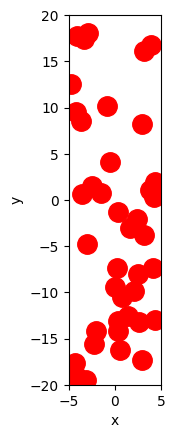

In [54]:
# Deel van de animated simulatie
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots()
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_xlim(-box_length/2, box_length/2)
ax.set_ylim(-box_height/2, box_height/2)
ax.set_aspect('equal')
dot, = ax.plot([], [], 'ro', ms=14)
heat_in = 0.0
heat_out = 0.0

def init():
    dot.set_data([], [])
    return dot,

# we kiezen het aantal datapunten zodat het volume tot 1/3 van het begin volume reduceert
num_steps = 1000

particles = []

box_length = BOX_SIZE_0         # zetten zuiger terug
box_height = 4*BOX_SIZE_0
v_piston = V_PISTON_0
create_particles(particles)     # resetten deeltjes     
set_temp = temperature(particles)  # instellen gewenste temperatuur voor thermostaat
def update(frame):
    take_time_step(particles)
    dot.set_data([p.r[0] for p in particles], [p.r[1] for p in particles])
    return dot,

print(len(particles), "deeltjes aangemaakt")
ani = FuncAnimation(fig, update, frames=int(num_steps/2), init_func=init, blit=True, interval=50)
HTML(ani.to_jshtml())

Gemiddelde toegevoerde warmte per tijdseenheid: 0.00012985501082053285


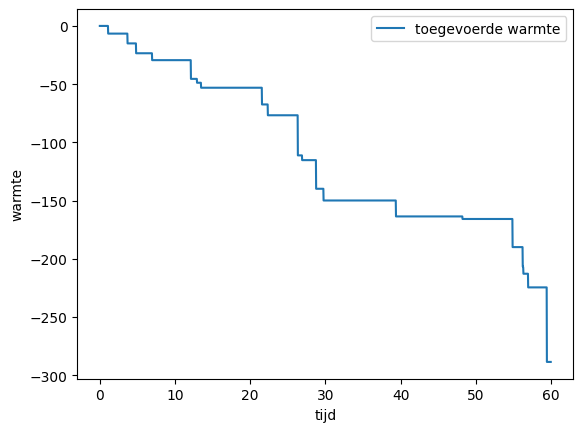

In [55]:

particles = []

box_length = BOX_SIZE_0         # zetten zuiger terug
box_height = 4*BOX_SIZE_0
v_piston = V_PISTON_0
heat_in = 0.0
heat_out = 0.0
create_particles(particles)     # resetten deeltjes     
set_temp = temperature(particles)  # instellen gewenste temperatuur voor thermostaat
heat_transfer = 0.0

heats_in = []
heats_out = []
heat_transfers = []


num_steps = 2000

for i in range(num_steps):
    take_time_step(particles)
    heats_in.append(heat_in)
    heats_out.append(heat_out)
    heat_transfers.append(heat_out/DT)

heat_transfer = abs(heat_out)/num_steps*DT
print("Gemiddelde toegevoerde warmte per tijdseenheid:", heat_transfer)

plt.figure()
plt.plot(np.arange(num_steps)*DT, heat_transfers, label='toegevoerde warmte')
plt.xlabel('tijd')
plt.ylabel('warmte')
plt.legend()
plt.show()


Hoogte     Flux (W)        Lambda (W/K)        
10.0       8.02e+02        1.90e+00            
20.0       1.57e+03        3.72e+00            
40.0       2.33e+03        5.54e+00            
60.0       3.18e+03        7.56e+00            
80.0       3.98e+03        9.44e+00            


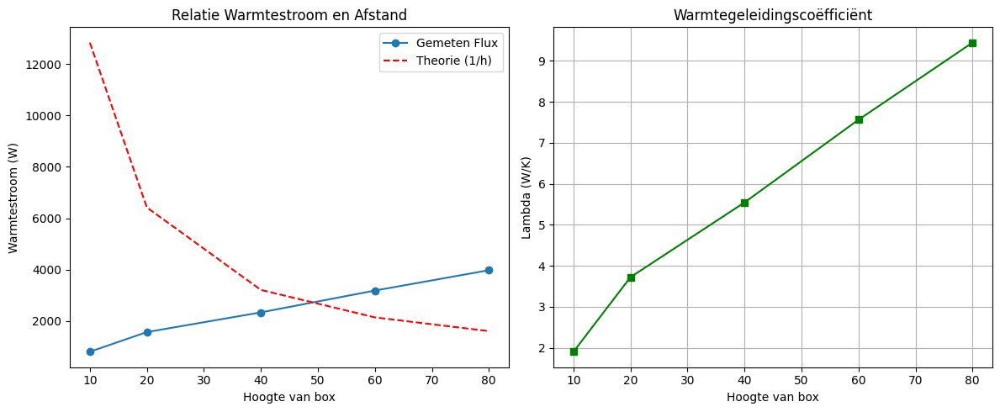

Gemiddelde warmtegeleidingscoëfficiënt ideaal gas: 5.64e+00 W/K


In [56]:
# Simulatie met variabele hoogte om warmtegeleiding te bepalen

# Variabele parameters voor de studie
height_factors = [1, 2, 4, 6, 8]  # Factoren om hoogte te schalen
conductivities = []
fluxes = []

print(f"{'Hoogte':<10} {'Flux (W)':<15} {'Lambda (W/K)':<20}")

for factor in height_factors:
    particles = []
    
    # Instellingen voor deze iteratie
    box_length = BOX_SIZE_0
    box_height = factor * BOX_SIZE_0
    v_piston = 0.0  # Zuiger staat stil
    n_current = factor * N  # Dichtheid constant houden
    
    # Initialisatie
    create_particles(particles, n_current)
    set_temp = temperature(particles) # Huidige temp als setpoint (Delta T wordt hierdoor bepaald)
    
    # Delta T berekenen: Top = 1.5*T, Bottom = 0.5*T -> Verschil = 1.0 * T
    delta_T = set_temp 
    
    # Evenwicht bereiken (zodat warmtestroom op gang komt)
    for _ in range(500):
        take_time_step(particles)
        
    # Meting starten
    num_measurement_steps = 1000
    total_flux_sum = 0.0
    
    for _ in range(num_measurement_steps):
        take_time_step(particles)
        # heat_in is positief (warmte erin via boven), heat_out is negatief (warmte eruit via onder)
        # Flux is gemiddelde van wat erin gaat en eruit gaat per tijdstap
        flux_now = (heat_in - heat_out) / 2.0 / DT
        total_flux_sum += flux_now
        
    avg_flux = total_flux_sum / num_measurement_steps
    fluxes.append(avg_flux)
    
    # Geleidingscoëfficiënt k (of lambda) berekenen
    # Wet van Fourier (2D): Flux = k * Breedte * (Delta T / Hoogte)
    # k = Flux * Hoogte / (Breedte * Delta T)
    k = avg_flux * box_height / (box_length * delta_T)
    conductivities.append(k)
    
    print(f"{box_height:<10.1f} {avg_flux:<15.2e} {k:<20.2e}")

# Resultaten plotten
box_heights = np.array(height_factors) * BOX_SIZE_0

plt.figure(figsize=(12, 5))

# Plot 1: Flux vs Hoogte (Check omgekeerd evenredig)
plt.subplot(1, 2, 1)
plt.plot(box_heights, fluxes, 'o-', label='Gemeten Flux')
# Theoretische curve: y = C / x
C = np.mean(np.array(fluxes) * box_heights)
plt.plot(box_heights, C / box_heights, 'r--', label='Theorie (1/h)')
plt.xlabel('Hoogte van box')
plt.ylabel('Warmtestroom (W)')
plt.title('Relatie Warmtestroom en Afstand')
plt.legend()

# Plot 2: Geleidingscoëfficiënt
plt.subplot(1, 2, 2)
plt.plot(box_heights, conductivities, 's-', color='green')
plt.xlabel('Hoogte van box')
plt.ylabel('Lambda (W/K)')
plt.title('Warmtegeleidingscoëfficiënt')
plt.grid(True)

plt.tight_layout()
plt.show()

print(f"Gemiddelde warmtegeleidingscoëfficiënt ideaal gas: {np.mean(conductivities):.2e} W/K")